<a href="https://colab.research.google.com/github/siddharth3444/detect_window/blob/main/hyper_parameter_trainner_final_26_06_24.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import sys
print(sys.path)
import pdb

['/content', '/env/python', '/usr/lib/python310.zip', '/usr/lib/python3.10', '/usr/lib/python3.10/lib-dynload', '', '/usr/local/lib/python3.10/dist-packages', '/usr/lib/python3/dist-packages', '/usr/local/lib/python3.10/dist-packages/IPython/extensions', '/root/.ipython']


In [ ]:
%pip install transformers accelerate optuna torch-summary albumentations wandb opencv-python  evaluate

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 309.4/309.4 kB 5.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 380.1/380.1 kB 34.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 21.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.1/84.1 kB 13.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.4/233.4 kB 35.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 32.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.1/296.1 kB 40.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 547.8/547.8 kB 55.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 19.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 23.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 22.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 13.6 MB/s eta 0:00:00
     ━━━━━━━━

In [ ]:
from google.colab import drive
drive.mount('/content/drive',force_remount=True)

Mounted at /content/drive


In [ ]:
! unzip /content/drive/MyDrive/Dataset/All_Images.zip -d ./Data

Streaming output truncated to the last 5000 lines.
  inflating: ./Data/All_Images/annotations/clqdbaaag0a060752xtsghhhe.png  
  inflating: ./Data/All_Images/annotations/clqdbaaag0a070752pa8fulft.png  
  inflating: ./Data/All_Images/annotations/clqdbaaag0a080752umzffj0l.png  
  inflating: ./Data/All_Images/annotations/clqdbaaag0a090752ldfe1q7l.png  
  inflating: ./Data/All_Images/annotations/clqdbaaag0a0a07523vsmfyjl.png  
  inflating: ./Data/All_Images/annotations/clqdbaaag0a0b0752qln71nbz.png  
  inflating: ./Data/All_Images/annotations/clqdbaaag0a0c075211a634bl.png  
  inflating: ./Data/All_Images/annotations/clqdbaaag0a0d07529eo3r9of.png  
  inflating: ./Data/All_Images/annotations/clqdbaaag0a0e0752okistz37.png  
  inflating: ./Data/All_Images/annotations/clqdbaaag0a0f0752ie5puqfs.png  
  inflating: ./Data/All_Images/annotations/clqdbaaag0a0g07526lmsv551.png  
  inflating: ./Data/All_Images/annotations/clqdbaaag0a0h0752r1f3mdyv.png  
  inflating: ./Data/All_Images/annotations/clqdba

In [ ]:
import os
import numpy as np
from PIL import Image
from sklearn.model_selection import train_test_split


dir="/content/Data/All_Images"
image_data_dir=f'{dir}/images'
annotation_data_dir=f'{dir}/annotations'
zIn=0

dataset=[]
idx=1
for item in os.listdir(f"{image_data_dir}/"):
  obj={}
  if zIn<6:
    name=item.split(".")[0]
    obj['image']=Image.open(f"{image_data_dir}/{name}.jpg")
    obj['annotation']=Image.open(f"{annotation_data_dir}/{name}.png")
    obj['_id']=idx
    dataset.append(obj)
    zIn+=1

new_data=dataset[:11]
train_data, test_data =  train_test_split(new_data,test_size=0.2,random_state=42)

print(f" Training Data {len(train_data)}")
print(f" Testing Data {len(test_data)}")


 Training Data 4
 Testing Data 2


<PIL.PngImagePlugin.PngImageFile image mode=RGB size=3034x4000 at 0x7D97C1786D10>
[0 1 2 3 4 5 6 7 8 9]
[0 1 3 4 5]


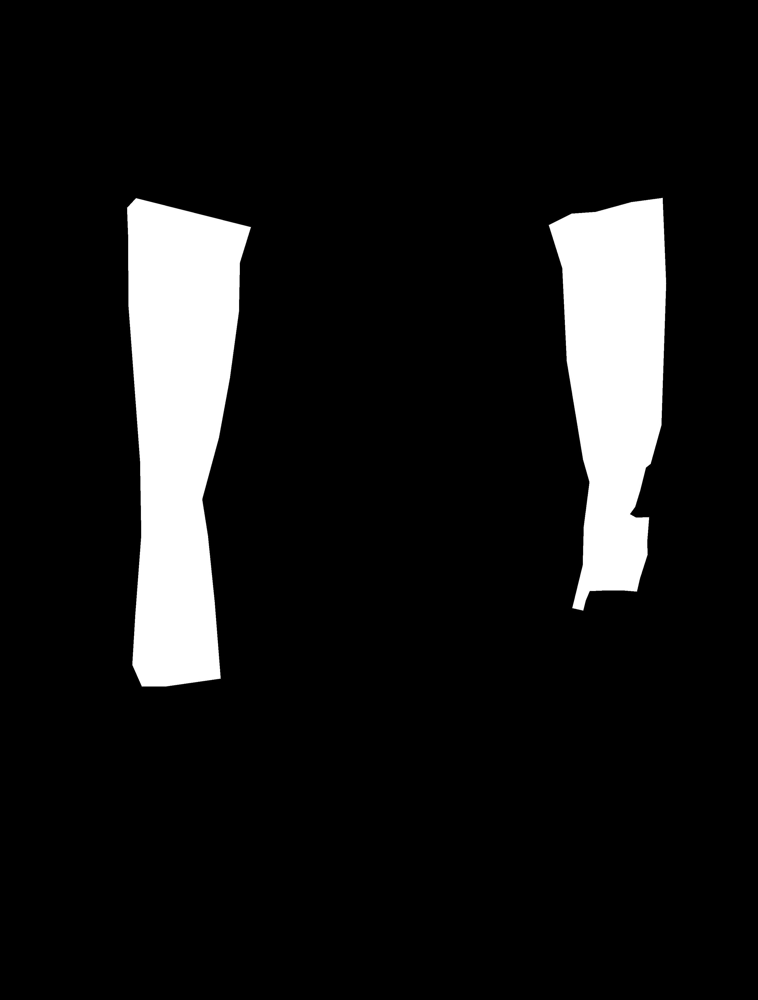

In [ ]:
# @title
id2label={ 5:'windowpane',4:'curtain',3:'blinds',2:'door',0:'wall',1:'floor'}
import numpy as np
index=3
print(train_data[index]['annotation'])
obj=np.array(train_data[index]['annotation'])
instance_seg=obj[...,1]
se_seg=obj[...,0]
print(np.unique(instance_seg))
print(np.unique(se_seg))
mask = (se_seg==4)
visual_mask = (mask * 255).astype(np.uint8)
Image.fromarray(visual_mask)

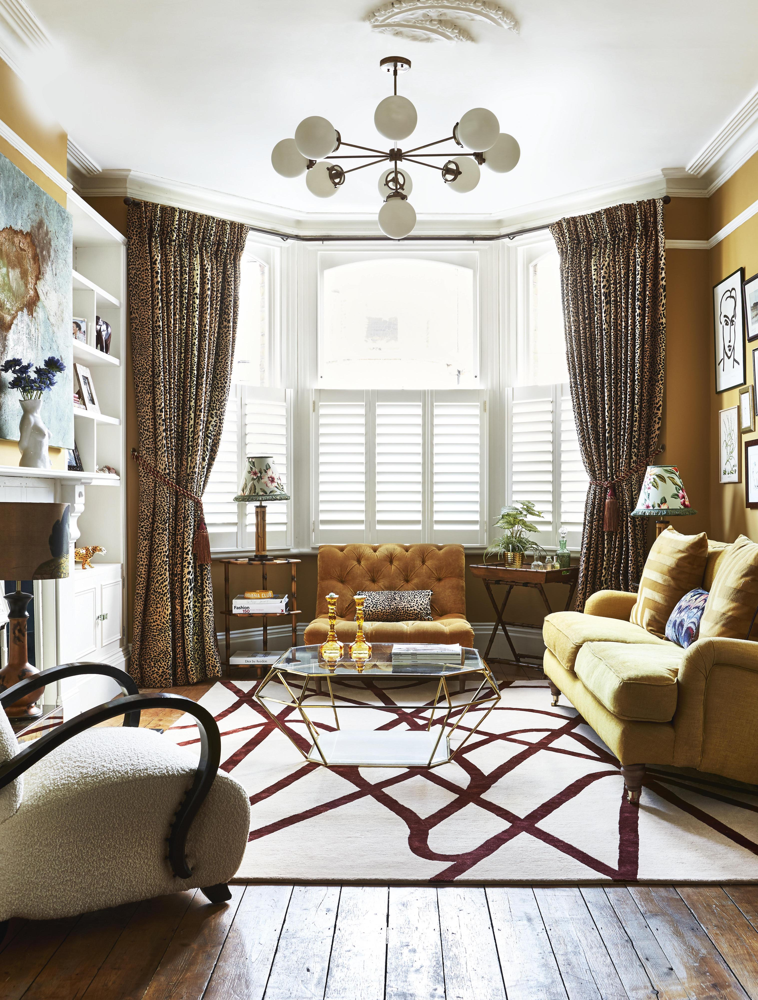

In [6]:
train_data[index]['image']

In [7]:
from transformers import MaskFormerImageProcessor
import numpy as np
from torch.utils.data import Dataset
import albumentations as A
from torch.utils.data import DataLoader


processor = MaskFormerImageProcessor(do_reduce_labels=True,ignore_index=255, do_resize=False, do_rescale=False, do_normalize=True)


class ImageSegmentationDataset(Dataset):
    """Image segmentation dataset."""

    def __init__(self,dataset,processor, transform=None):
        """
        Args:
            dataset
        """
        self.dataset = dataset
        self.processor = processor
        self.transform = transform

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        image = np.array(self.dataset[idx]['image'].convert("RGB"))
        instance_seg = np.array(self.dataset[idx]['annotation'])[:,:,1]
        class_id_map = np.array(self.dataset[idx]['annotation'])[:,:,0]
        class_labels = np.unique(class_id_map)

        inst2class = {}
        for label in class_labels:
            instance_ids = np.unique(instance_seg[class_id_map == label])
            inst2class.update({i: label for i in instance_ids})

        # apply transforms
        if self.transform is not None:
            transformed = self.transform(image=image, mask=instance_seg)
            image, instance_seg = transformed['image'], transformed['mask']
            # convert to C, H, W
            image = image.transpose(2,0,1)

        if class_labels.shape[0] == 1 and class_labels[0] == 0:
            # Some image does not have annotation (all ignored)
            inputs = self.processor([image], return_tensors="pt")
            inputs = {k:v.squeeze() for k,v in inputs.items()}
            inputs["class_labels"] = torch.tensor([0])
            inputs["mask_labels"] = torch.zeros((0, inputs["pixel_values"].shape[-2], inputs["pixel_values"].shape[-1]))
        else:
          inputs = self.processor([image], [instance_seg], instance_id_to_semantic_id=inst2class, return_tensors="pt")
          inputs = {k: v.squeeze() if isinstance(v, torch.Tensor) else v[0] for k,v in inputs.items()}

        return inputs



ADE_MEAN = np.array([123.675, 116.280, 103.530]) / 255
ADE_STD = np.array([58.395, 57.120, 57.375]) / 255

# note that you can include more fancy data augmentation methods here
train_transform = A.Compose([
    A.Resize(width=512, height=512),
    #A.RandomResizedCrop(width=512, height=512, scale=(0.5, 1.0)),
    A.HorizontalFlip(),
    A.VerticalFlip(),
    #A.Rotate(limit=45),
    A.Normalize(mean=ADE_MEAN, std=ADE_STD),
])

train_dataset = ImageSegmentationDataset(train_data, processor=processor, transform=train_transform)
test_dataset = ImageSegmentationDataset(test_data, processor=processor, transform=train_transform)

def freeze_layer(model):
    for param in model.parameters():
           param.requires_grad = False

def collate_fn(batch):
    pixel_values = torch.stack([example["pixel_values"] for example in batch])
    pixel_mask = torch.stack([example["pixel_mask"] for example in batch])
    class_labels = [example["class_labels"] for example in batch]
    mask_labels = [example["mask_labels"] for example in batch]
    return {"pixel_values": pixel_values, "pixel_mask": pixel_mask, "class_labels": class_labels, "mask_labels": mask_labels}

In [8]:
from transformers import EvalPrediction
from transformers import MaskFormerForInstanceSegmentation,MaskFormerConfig, Trainer, TrainingArguments, EarlyStoppingCallback
import numpy as np
import evaluate
import datetime
metrics = evaluate.load("mean_iou")
id2label={ 5:'windowpane',4:'curtain',3:'blinds',2:'door',0:'wall',1:'floor'}

def compute_metrics(eval_pred):
    pdb.set_trace()
    print(eval_pred)
    logits, labels,inputs = eval_pred.predictions, eval_pred.label_ids ,eval_pred.inputs
    print(type(inputs))
    print(type(logits))
    print(type(labels))
    #preds = np.argmax(logits, axis=1)
    semantic_seg_mask=[]
    for logit in logits:
      print("=====================")
      print("login=>",logit.shape)
      #print(logit)
      ar=np.argmax(logit, axis=0)
      #print(ar.shape)
      print("ar=>",ar.shape)
      #print(ar)
      semantic_seg_mask.append(ar)

    #labels=labels.flatten()
    print(len(semantic_seg_mask))
    print(len(labels))
    print(labels[0][0].shape)
    print(labels[1])
    print(len(inputs))
    results = metrics.compute(
              predictions=semantic_seg_mask,
              references=inputs,
              num_labels=7,
              ignore_index=255
    )
    return {
        "mean_iou": results['mean_iou'],
        "mean_accuracy": results['mean_accuracy'],
        "overall_accuracy": results['overall_accuracy']
     }


# def compute_metrics(eval_pred: EvalPrediction):
#     # Extract predictions and labels from the EvalPrediction object
#     predictions, labels = eval_pred.predictions, eval_pred.label_ids

#     # Convert predictions to a tensor and get the predicted class labels
#     pred_class_logits = torch.tensor(predictions[0])  # assuming predictions[0] contains the class logits
#     pred_class_labels = torch.argmax(pred_class_logits, dim=1).cpu().numpy()

#     # Convert labels to a numpy array
#     labels = np.array(labels)

#     # Flatten the labels and predictions for comparison
#     labels = labels.flatten()
#     pred_class_labels = pred_class_labels.flatten()

#     # Update the metric with predictions and references
#     metric.add_batch(predictions=pred_class_labels, references=labels)

#     # Compute the metric
#     num_labels = model.config.num_labels if hasattr(model.config, 'num_labels') else len(np.unique(labels))
#     result = metric.compute(num_labels=num_labels,
#                             ignore_index=-1,
#                             reduce_labels=False)

    return result

# def compute_metrics(eval_pred):
#     print(eval_pred)
#     logits, labels = eval_pred.predictions, eval_pred.label_ids
#     # Handle the potential for varying numbers of instances per image
#     preds = [np.argmax(logit, axis=0) for logit in logits]
#     # Pad the predictions to a common shape if necessary
#     max_length = max(len(pred) for pred in preds)
#     preds = np.array([np.pad(pred, (0, max_length - len(pred)), 'constant', constant_values=255) for pred in preds])
#     # Now compute metrics as before
#     results = metrics.compute(predictions=preds, references=labels, num_labels=7, ignore_index=255)
#     return {
#         "mean_iou": results['mean_iou'],
#         "mean_accuracy": results['mean_accuracy'],
#         "overall_accuracy": results['overall_accuracy']
#     }

def model_init(trial=None):
    params = {}
    if trial:
        params = trial.params
    config = MaskFormerConfig.from_pretrained("facebook/maskformer-swin-large-ade")
    config.id2label = id2label
    config.label2id = {id2label[label]: index for index, label in enumerate(id2label)}
    config.dice_weight = params.get("dice_weight", 1.0)
    config.cross_entropy_weight = params.get("cross_entropy_weight", 1.0)
    config.mask_weight = params.get("mask_weight", 20.0)
    config.init_xavier_std = params.get("init_xavier_std", 1)
    config.init_std = params.get("init_std", 1)
    model = MaskFormerForInstanceSegmentation.from_pretrained("facebook/maskformer-swin-large-ade", config=config, ignore_mismatched_sizes=True)
    return model


def optuna_hp_space(trial):
      return {
          "optim": trial.suggest_categorical('optim', ["adamw_torch"]),
          "learning_rate": trial.suggest_float("learning_rate", 5e-5, 1e-4, log=True),
          # "per_device_train_batch_size": trial.suggest_categorical("per_device_train_batch_size", [10, 12]),
          "weight_decay": trial.suggest_loguniform('weight_decay', 1e-4, 1e-2),
          "num_decoder_layers": trial.suggest_int('num_decoder_layers', 6, 10),
          "auxiliary_loss_weight": trial.suggest_uniform('auxiliary_loss_weight', 0.1, 0.5),
          "dice_weight": trial.suggest_uniform('dice_weight', 0.1, 1),
          "cross_entropy_weight": trial.suggest_uniform('cross_entropy_weight', 0.1, 1),
          "mask_weight": trial.suggest_uniform("mask_weight", 0.0, 20.0),
          "init_xavier_std": trial.suggest_float("init_xavier_std", 0.5, 1.0),
          "init_std": trial.suggest_float("init_std", 0.5, 1.0),
          "num_train_epochs": trial.suggest_int("num_train_epochs", 1, 5),
          "batch_size": trial.suggest_categorical("batch_size", [1, 2, 4]),
      }

current_time = datetime.datetime.now()

training_args = TrainingArguments(
  output_dir="./output",
  save_strategy="epoch",
  evaluation_strategy="epoch",
  num_train_epochs=5,
  save_total_limit=1,
  #gradient_accumulation_steps=4,
#  gradient_checkpointing=True,
  per_device_train_batch_size=1,
  per_device_eval_batch_size=1,
  eval_steps=5 ,
  save_steps =4,
  fp16=True,
  report_to =None,
  run_name="Grabber-Training_HyperParamter "+current_time.strftime("%m/%d/%Y, %H:%M:%S"),
  logging_steps =4,
  load_best_model_at_end =True
)

final_trainer = Trainer(
    model_init=model_init,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=test_dataset,
    data_collator=collate_fn,
    callbacks=[EarlyStoppingCallback(early_stopping_patience=3)],
    compute_metrics=compute_metrics
)

early_stopping_callback = EarlyStoppingCallback(
    early_stopping_patience=3,  # Number of evaluations with no improvement after which training will be stopped
    early_stopping_threshold=0.01  # The improvement threshold to qualify as a significant change
)






/usr/local/lib/python3.10/dist-packages/transformers/training_args.py:1474: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models 

config.json:   0%|          | 0.00/12.5k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/851M [00:00<?, ?B/s]

Some weights of MaskFormerForInstanceSegmentation were not initialized from the model checkpoint at facebook/maskformer-swin-large-ade and are newly initialized because the shapes did not match:
- class_predictor.weight: found shape torch.Size([151, 256]) in the checkpoint and torch.Size([7, 256]) in the model instantiated
- class_predictor.bias: found shape torch.Size([151]) in the checkpoint and torch.Size([7]) in the model instantiated
- criterion.empty_weight: found shape torch.Size([151]) in the checkpoint and torch.Size([7]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
import torch
best_run = final_trainer.hyperparameter_search(
    direction="minimize",
    backend="optuna",
    hp_space=optuna_hp_space,
    n_trials=2
)

[I 2024-06-25 14:17:47,458] A new study created in memory with name: no-name-3101b2a6-2290-45e7-8c2e-0ab6e341cf43
<ipython-input-33-f04271e3d4f3>:149: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "weight_decay": trial.suggest_loguniform('weight_decay', 1e-4, 1e-2),
<ipython-input-33-f04271e3d4f3>:151: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "auxiliary_loss_weight": trial.suggest_uniform('auxiliary_loss_weight', 0.1, 0.5),
<ipython-input-33-f04271e3d4f3>:152: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "dice_weight": trial.suggest_uniform(

train/epoch,▁
train/global_step,▁
train/learning_rate,▁
train/loss,▁
train/epoch,1.0
train/global_step,4
train/grad_norm,nan
train/learning_rate,0.0001
train/loss,18.7662


Epoch,Training Loss,Validation Loss


[W 2024-06-25 14:18:06,610] Trial 0 failed with parameters: {'optim': 'adamw_torch', 'learning_rate': 5.2772741034200937e-05, 'weight_decay': 0.003330223858396015, 'num_decoder_layers': 8, 'auxiliary_loss_weight': 0.4986204360918507, 'dice_weight': 0.7990888522081725, 'cross_entropy_weight': 0.30281721206123113, 'mask_weight': 16.41178358474058, 'init_xavier_std': 0.9762307022692598, 'init_std': 0.9168228112488352, 'num_train_epochs': 3, 'batch_size': 1} because of the following error: AttributeError("'tuple' object has no attribute 'flatten'").
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/optuna/study/_optimize.py", line 196, in _run_trial
    value_or_values = func(trial)
  File "/usr/local/lib/python3.10/dist-packages/transformers/integrations/integration_utils.py", line 200, in _objective
    trainer.train(resume_from_checkpoint=checkpoint, trial=trial)
  File "/usr/local/lib/python3.10/dist-packages/transformers/trainer.py", line 1885, in trai

Labels type: <class 'tuple'>
No shape attribute


AttributeError: 'tuple' object has no attribute 'flatten'

In [ ]:
import json
b_t={"optim": "adamw_torch", "learning_rate": 9.971930719778446e-05, "per_device_train_batch_size": 10, "weight_decay": 0.00019277664635316874, "num_decoder_layers": 6, "auxiliary_loss_weight": 0.2004091340099437, "dice_weight": 0.3280037047000379, "cross_entropy_weight": 0.207234463928762, "mask_weight": 1.9803763515498707, "init_xavier_std": 0, "init_std": 0.930439651714732, "num_train_epochs": 3, "batch_size": 32}

In [ ]:
import torch
import gc
torch.cuda.empty_cache()
gc.collect()

0

In [ ]:
from transformers import MaskFormerForInstanceSegmentation,MaskFormerModel,TrainingArguments,MaskFormerConfig,Trainer
import torch
id2label={ 5:'windowpane',4:'curtain',3:'blinds',2:'door',0:'wall',1:'floor'}
config= MaskFormerConfig.from_pretrained("facebook/maskformer-swin-large-ade")
config.id2label=id2label
config.label2id={id2label[label]: index for index, label in enumerate(id2label)}
config.dice_weight = b_t.get("dice_weight",1.0)
config.cross_entropy_weight = b_t.get("cross_entropy_weight", 1.0)
config.mask_weight = b_t.get("mask_weight", 20.0)
config.init_xavier_std  = b_t.get("init_xavier_std", 1)
config.init_std  = b_t.get("init_std", 1)
model = MaskFormerForInstanceSegmentation.from_pretrained("facebook/maskformer-swin-large-ade",config=config,ignore_mismatched_sizes=True)


In [ ]:
import gc
import torch
num_gpus = torch.cuda.device_count()
print("===>",num_gpus)
gc.collect()

In [ ]:
import datetime
final_training_args = TrainingArguments(
    output_dir="/content/Model/output",               # Output directory for checkpoints and other outputs
    fp16= True,
    save_steps=200,                        # Save checkpoint every 10 steps
    save_strategy="steps",
    save_total_limit=2,                   # Limit the total number of checkpoints to 5
    #gradient_accumulation_steps=200,
    save_safetensors =True,
    per_device_train_batch_size=7,
    per_device_eval_batch_size =7,
    logging_dir='./logs',                 # Directory for logging
    logging_steps=100,                     # Log every 10 steps
    logging_strategy="epoch",
    optim='adamw_torch',
    evaluation_strategy="epoch",          # Evaluation strategy to use during training
    eval_steps=200 ,
    report_to ="wandb",
    run_name="Grabber-Training "+datetime.datetime.now().strftime("%m/%d/%Y, %H:%M:%S"),
    num_train_epochs=50,
    weight_decay=b_t['weight_decay'],
    learning_rate=b_t['learning_rate'],
)


final_trainer = Trainer(
    model=model ,
    args=final_training_args,
    train_dataset=train_dataset,  # Define your train dataset
    eval_dataset=test_dataset,
    data_collator=collate_fn,
    #is_model_parallel=True
)

In [ ]:
!rm -rf /content/Model/output

In [ ]:
from transformers.trainer_utils import get_last_checkpoint

last_checkpoint = None
if os.path.isdir(final_training_args.output_dir) and bool(os.listdir(final_training_args.output_dir)):
    last_checkpoint = get_last_checkpoint(final_training_args.output_dir)


print(last_checkpoint)

In [ ]:
final_trainer.train()

In [ ]:
final_trainer.train(resume_from_checkpoint="/content/Model/output/checkpoint-400")

In [ ]:
import gc
torch.cuda.empty_cache()
gc.collect()

In [ ]:
final_trainer.save_model(output_dir="/content/drive/MyDrive/Model")

In [ ]:
final_trainer.state.save_to_json(os.path.join("/content/drive/MyDrive/Model", "trainer_state.json"))

In [ ]:
final_trainer.train(resume_from_checkpoint="/content/drive/MyDrive/Model")

In [ ]:
idx = 16
image = test_data[idx]["image"]
image

In [ ]:
from transformers import MaskFormerImageProcessor

processor = MaskFormerImageProcessor()

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
from transformers import MaskFormerFeatureExtractor, MaskFormerForInstanceSegmentation
preprocessor = MaskFormerFeatureExtractor.from_pretrained("facebook/maskformer-swin-large-ade")

In [ ]:
inputs = processor(image, return_tensors="pt").to(device)
for k,v in inputs.items():
  print(k,v.shape)

In [ ]:
import torch
model.to(device)
# forward pass
with torch.no_grad():
  outputs = model(**inputs.to(device))

In [ ]:
results = processor.post_process_semantic_segmentation(outputs, target_sizes=[image.size[::-1]])[0]
data = (results.cpu().numpy())
print(np.unique(data))
mask=data==1
visual_mask = (mask * 255).astype(np.uint8)
visual_mask = Image.fromarray(visual_mask)
display(visual_mask)

In [ ]:
results = processor.post_process_instance_segmentation(outputs, target_sizes=[image.size[::-1]])[0]
print(results.keys())
print(np.unique(results['segmentation']))

In [ ]:
for segment in results['segments_info']:
  print(segment)

In [ ]:
import numpy as np

def get_mask(segmentation, segment_id):
  mask = (segmentation.cpu().numpy() == segment_id)
  visual_mask = (mask * 255).astype(np.uint8)
  visual_mask = Image.fromarray(visual_mask)

  return visual_mask

In [ ]:
np.unique(results['segmentation'].cpu().numpy())

In [ ]:
for segment in results['segments_info']:
   # print("Visualizing mask for instance:", model.config.id2label[segment['label_id']])
    mask = get_mask(results['segmentation'], segment['id'])
    display(mask)
    print("------")

In [ ]:
def visualize_instance_seg_mask(mask):
    # Initialize image with zeros with the image resolution
    # of the segmentation mask and 3 channels
    image = np.zeros((mask.shape[0], mask.shape[1], 3))
    # Create labels
    labels = np.unique(mask)
    label2color = {
        label: (
            random.randint(0, 255),
            random.randint(0, 255),
            random.randint(0, 255),
        )
        for label in labels
    }
    for height in range(image.shape[0]):
        for width in range(image.shape[1]):
            image[height, width, :] = label2color[mask[height, width]]
    image = image / 255
    return image


instance_seg_mask_disp = visualize_instance_seg_mask(instance_seg_mask)
plt.figure(figsize=(10, 10))

for plot_index in range(2):
    if plot_index == 0:
        plot_image = image
        title = "Original"
    else:
        plot_image = instance_seg_mask_disp
        title = "Segmentation"

    plt.subplot(1, 2, plot_index+1)
    plt.imshow(plot_image)
    plt.title(title)
    plt.axis("off")


In [ ]:
!pip install evaluate tqdm
!pip show evaluate

In [ ]:
import evaluate
from tqdm import tqdm
metrics = evaluate.load("mean_iou")
# Set model in evaluation mode
model.eval()
# Test set doesn't have annotations so we will use the validation set
ground_truths, preds = [], []
for idx in tqdm(range(200)):
    image = test_data[idx]["image"].convert("RGB")
    target_size = image.size[::-1]
    # Get ground truth semantic segmentation map
    annotation = np.array(test_data[idx]["annotation"])[:,:,0]
    # Replace null class (0) with the ignore_index (255) and reduce labels
    annotation -= 1
    annotation[annotation==-1] = 255
    ground_truths.append(annotation)
    # Preprocess image
    inputs = processor(images=image, return_tensors="pt").to(device)
    # Inference
    model.eval()
    with torch.no_grad():
        outputs = model(**inputs)

    # Post-process results to retrieve semantic segmentation maps
    result = processor.post_process_semantic_segmentation(outputs, target_sizes=[target_size])[0]
    semantic_seg_mask = result.cpu().detach().numpy()
    preds.append(semantic_seg_mask)
results = metrics.compute(
    predictions=preds,
    references=ground_truths,
    num_labels=100,
    ignore_index=255
)
print(f"Mean IoU: {results['mean_iou']} | Mean Accuracy: {results['mean_accuracy']} | Overall Accuracy: {results['overall_accuracy']}")